In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn.functional import relu
from scipy.io import loadmat
import os
from os import listdir
import pandas as pd
from skimage import io
from PIL import Image

In [2]:
moving_files = []
for f in os.listdir('/mnt/pesaranlab/People/Capstone_students/Noah/datav3/move/'):
    moving_files.append(f)
        
sleeping_files = []
for f in os.listdir('/mnt/pesaranlab/People/Capstone_students/Noah/datav3/sleep/'):
    sleeping_files.append(f)

In [3]:
len(moving_files), len(sleeping_files)

(2592, 3035)

In [4]:
class NoahSpectrogramDataset(Dataset):
    def __init__(self, mode='train' ,moving_files=moving_files,sleeping_files=sleeping_files):
        self.movement_files = moving_files
        self.sleeping_files = sleeping_files
        all_files = self.sleeping_files + self.movement_files
        if mode == 'train':
            self.all_files = [f for f in all_files if '0329' not in f]
        elif mode == 'valid':
            self.all_files = [f for f in all_files if '0329' in f]
            
    def __len__(self):
        return len(self.all_files)
    
    def __getitem__(self, idx):
        mvmt_type  = self.all_files[idx].split('_')[-1].split('.')[0]
        spec = torch.from_numpy(np.load('/mnt/pesaranlab/People/Capstone_students/Noah/datav3/'+ mvmt_type +'/' +self.all_files[idx])) 
        if mvmt_type == 'move':
            label = torch.Tensor([0])
        elif mvmt_type == 'sleep':
            label = torch.Tensor([1])
        else:
            label = torch.Tensor([-1])
        return spec, label

In [5]:
train_dataset = NoahSpectrogramDataset(mode='train')
valid_dataset = NoahSpectrogramDataset(mode='valid')

In [6]:
train_loader = DataLoader(dataset = train_dataset, batch_size = 64, shuffle = True)
val_loader = DataLoader(dataset = valid_dataset, batch_size = 64, shuffle = False)

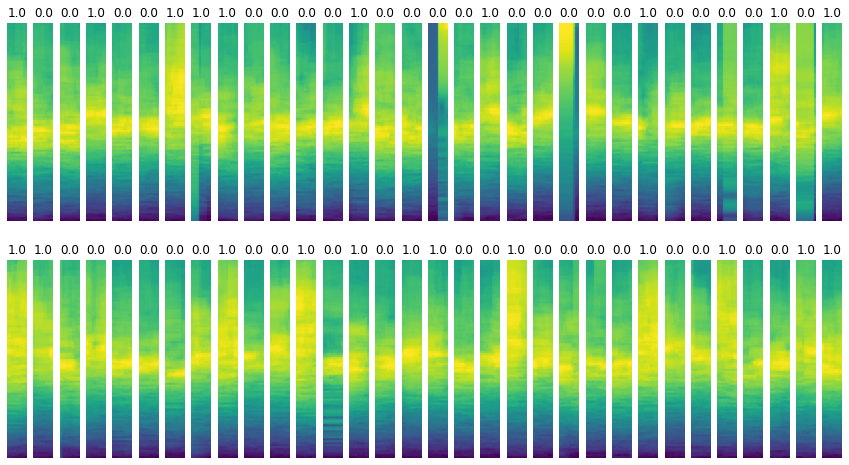

In [9]:
for batch_idx, (data, labels) in enumerate(train_loader):
    plt.figure(figsize=(15,8))
    for i in range(64):
        data_sub = data[i]
        plt.subplot(2,32,i+1)
        plt.axis('off')
        plt.imshow(data_sub)
        plt.title(str(np.array(labels[i])[0]))
    plt.show()
    break

In [7]:
class LogReg(nn.Module):
    def __init__(self, input_dim=100*10, output_dim=1):
        super(LogReg, self).__init__()
        self.linear = torch.nn.Linear(input_dim, output_dim)

    def forward(self, x):
        x = x.reshape([x.shape[0], 1, -1]).float()
        outputs = torch.sigmoid(self.linear(x))
        return outputs

In [8]:
def get_accuracy(loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for data, labels in loader:
            data = data.to(device)
            labels = labels.to(device).float()
            outputs = model(data)
            predictions = []
            for o in outputs:
                if o.item() > .5:
                    predictions.append(1)
                else:
                    predictions.append(0)
            predictions = np.array(predictions)
            total += labels.size(0)
            correct += (predictions.flatten() == labels.flatten().cpu().numpy()).sum().item()
    return correct / total

In [9]:
def train(epoch, alpha=0):
    model.train()
    batch_losses = []
    
    preds = []
    labs = []
    
    for batch_idx, (data, labels) in enumerate(train_loader):
        data = data.to(device)
        labels = labels.to(device).float()
        
        if (torch.isinf(data).any()) or (torch.isnan(data).any()):
            continue
        
        outputs = model(data)
        loss = criterion(outputs.reshape(outputs.shape[0],-1), labels)
        W = model.linear.weight.view(100, 10)
        diff_h = (W[:, 1:] - W[:, :-1]).norm(2)
        diff_v = (W[1:, :] - W[:-1, :]).norm(2)
        loss += alpha*(diff_h + diff_v)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        batch_losses.append(loss)
        
        predictions = []
        for o in outputs:
            if o.item() > .5:
                predictions.append(1)
            else:
                predictions.append(0)
        predictions = np.array(predictions)
        preds.append(predictions.flatten())
        labs.append(labels.flatten().cpu().numpy())
        
    epoch_loss = sum(batch_losses)/len(batch_losses)
    acc = get_accuracy(train_loader) 
    return epoch_loss, acc, preds, labs

def test(loader):
    model.eval()
    batch_losses = []
    preds = []
    labs = []
    
    with torch.no_grad():
        for batch_idx, (data, labels) in enumerate(loader):
            data = data.to(device)
            labels = labels.to(device).float()
            
            if (torch.isinf(data).any()) or (torch.isnan(data).any()):
                continue
            
            outputs = model(data)
            loss = criterion(outputs.reshape(outputs.shape[0],-1), labels)
            
            batch_losses.append(loss)
            
            predictions = []
            for o in outputs:
                if o.item() > .5:
                    predictions.append(1)
                else:
                    predictions.append(0)
            predictions = np.array(predictions)
            preds.append(predictions.flatten())
            labs.append(labels.flatten().cpu().numpy())
        
        
        epoch_loss = sum(batch_losses)/len(batch_losses)
        
    acc = get_accuracy(loader)
    return epoch_loss,acc, preds, labs

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# device = 'cpu'
print(device)

tol = 0.01
learning_rate = 0.001
num_epochs = 51
l2 = 0
alpha = 0

model = LogReg().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate) # reduced learning rate 

cuda


Train loss for epoch 0: 0.4658743441104889
Val loss for epoch 0: 0.3367363512516022


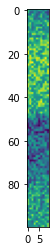

Train loss for epoch 1: 0.36869001388549805
Val loss for epoch 1: 0.3407990634441376
Train loss for epoch 2: 0.3492433428764343
Val loss for epoch 2: 0.3352203667163849
Train loss for epoch 3: 0.3425416946411133
Val loss for epoch 3: 0.31402117013931274
Train loss for epoch 4: 0.33756908774375916
Val loss for epoch 4: 0.34049877524375916
Train loss for epoch 5: 0.32361412048339844
Val loss for epoch 5: 0.3194755017757416


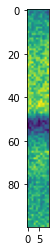

Train loss for epoch 6: 0.32098206877708435
Val loss for epoch 6: 0.32094433903694153
Train loss for epoch 7: 0.3184164762496948
Val loss for epoch 7: 0.3033253252506256
Train loss for epoch 8: 0.3183400332927704
Val loss for epoch 8: 0.3215717077255249
Train loss for epoch 9: 0.3146655857563019
Val loss for epoch 9: 0.3683597445487976
Train loss for epoch 10: 0.31396427750587463
Val loss for epoch 10: 0.3426319360733032


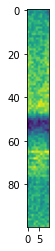

Train loss for epoch 11: 0.3092392086982727
Val loss for epoch 11: 0.3868487775325775
Train loss for epoch 12: 0.3133906424045563
Val loss for epoch 12: 0.30577993392944336
Train loss for epoch 13: 0.3069744110107422
Val loss for epoch 13: 0.3618508279323578
Train loss for epoch 14: 0.30328401923179626
Val loss for epoch 14: 0.34259912371635437
Train loss for epoch 15: 0.30035582184791565
Val loss for epoch 15: 0.3236546814441681


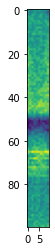

Train loss for epoch 16: 0.3054106831550598
Val loss for epoch 16: 0.31791025400161743
Train loss for epoch 17: 0.3001246452331543
Val loss for epoch 17: 0.32161426544189453
Train loss for epoch 18: 0.29951339960098267
Val loss for epoch 18: 0.36582183837890625
Train loss for epoch 19: 0.2973521947860718
Val loss for epoch 19: 0.32000085711479187
Train loss for epoch 20: 0.2976323366165161
Val loss for epoch 20: 0.33166828751564026


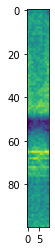

Train loss for epoch 21: 0.29498088359832764
Val loss for epoch 21: 0.32214730978012085
Train loss for epoch 22: 0.29636067152023315
Val loss for epoch 22: 0.3399677276611328
Train loss for epoch 23: 0.30061420798301697
Val loss for epoch 23: 0.3244797885417938
Train loss for epoch 24: 0.3031928539276123
Val loss for epoch 24: 0.33733341097831726
Train loss for epoch 25: 0.2952037751674652
Val loss for epoch 25: 0.34131309390068054


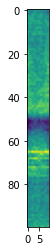

Train loss for epoch 26: 0.2946791350841522
Val loss for epoch 26: 0.333900511264801
Train loss for epoch 27: 0.29296353459358215
Val loss for epoch 27: 0.32583245635032654
Train loss for epoch 28: 0.29709702730178833
Val loss for epoch 28: 0.3177267611026764
Train loss for epoch 29: 0.29708153009414673
Val loss for epoch 29: 0.31002727150917053
Train loss for epoch 30: 0.29471907019615173
Val loss for epoch 30: 0.3420359194278717


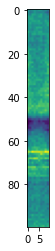

Train loss for epoch 31: 0.2969576120376587
Val loss for epoch 31: 0.31225693225860596
Train loss for epoch 32: 0.30106985569000244
Val loss for epoch 32: 0.34644395112991333
Train loss for epoch 33: 0.2919124364852905
Val loss for epoch 33: 0.341818630695343
Train loss for epoch 34: 0.29620274901390076
Val loss for epoch 34: 0.3205934464931488
Train loss for epoch 35: 0.29516008496284485
Val loss for epoch 35: 0.33847182989120483


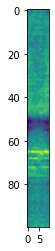

Train loss for epoch 36: 0.29205650091171265
Val loss for epoch 36: 0.3320532739162445
Train loss for epoch 37: 0.2907625138759613
Val loss for epoch 37: 0.33800092339515686
Train loss for epoch 38: 0.2909736633300781
Val loss for epoch 38: 0.33673739433288574
Train loss for epoch 39: 0.2916925251483917
Val loss for epoch 39: 0.31264299154281616
Train loss for epoch 40: 0.289639413356781
Val loss for epoch 40: 0.3488602638244629


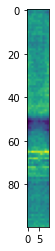

Train loss for epoch 41: 0.29052016139030457
Val loss for epoch 41: 0.3357661962509155
Train loss for epoch 42: 0.29692426323890686
Val loss for epoch 42: 0.3315701484680176
Train loss for epoch 43: 0.29510778188705444
Val loss for epoch 43: 0.3130800426006317
Train loss for epoch 44: 0.294045090675354
Val loss for epoch 44: 0.332658052444458
Train loss for epoch 45: 0.29094967246055603
Val loss for epoch 45: 0.31615787744522095


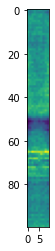

Train loss for epoch 46: 0.2888331413269043
Val loss for epoch 46: 0.3588272035121918
Train loss for epoch 47: 0.2914973795413971
Val loss for epoch 47: 0.32389724254608154
Train loss for epoch 48: 0.29123130440711975
Val loss for epoch 48: 0.3390193581581116
Train loss for epoch 49: 0.2893906235694885
Val loss for epoch 49: 0.3240629732608795
Train loss for epoch 50: 0.2888157069683075
Val loss for epoch 50: 0.32613950967788696


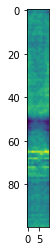

In [30]:
epochs = []
training_losses = []
training_acc = []
val_losses = []
validation_acc = []

train_predictions = []
validation_predictions = []
train_labels = []
validation_labels = []

for epoch in range(num_epochs):
    avg_train_loss, train_acc, train_preds, train_labs = train(epoch, alpha=alpha)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_acc, val_preds, val_labels = test(val_loader)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    if val_losses:
        if val_loss < min(val_losses):
            path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v3'
            torch.save(model.state_dict(), '{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha))
    if epoch%5 == 0:
        weights = model.linear.weight.view(100, 10)
        plt.imshow(weights.detach().cpu())
        plt.show()
    epochs.append(epoch)
    training_losses.append(avg_train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    
    train_predictions.append(train_preds)
    train_labels.append(train_labs)
    validation_predictions.append(val_preds)
    validation_labels.append(val_labels)
    
    if avg_train_loss < tol:
        break

In [ ]:
plt.style.use('dark_background')

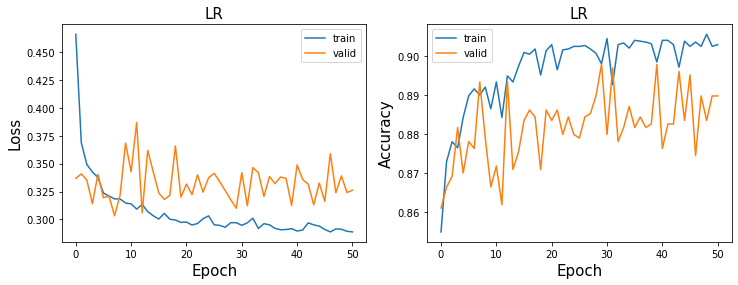

In [31]:
plt.style.use('dark_background')

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

In [32]:
predictions_train = np.stack(train_predictions[-1:][0][:-1]).flatten()
labels_train = np.stack(train_labels[-1:][0][:-1]).flatten()
predictions_val = np.stack(validation_predictions[-1:][0][:-1]).flatten()
labels_val = np.stack(validation_labels[-1:][0][:-1]).flatten()

predictions_train = np.concatenate((predictions_train, train_predictions[-1:][0][-1:][0]))
labels_train = np.concatenate((labels_train, train_labels[-1:][0][-1:][0]))
predictions_val = np.concatenate((predictions_val, validation_predictions[-1:][0][-1:][0]))
labels_val = np.concatenate((labels_val, validation_labels[-1:][0][-1:][0]))

df_train = pd.DataFrame({'predictions': predictions_train, 'labels': labels_train})
df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

cm_train = confusion_matrix(labels_train, predictions_train)
cm_test = confusion_matrix(labels_val, predictions_val)
ax = plt.axes()
sn.heatmap(cm_train, annot = True, fmt = "d", ax = ax)
ax.set_title('Train Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()
ax = plt.axes()
sn.heatmap(cm_test, annot = True, fmt = "d", ax = ax)
ax.set_title('Test Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()

In [33]:
predictions_train = np.concatenate((predictions_train, train_predictions[-1:][0][-1:][0]))
labels_train = np.concatenate((labels_train, train_labels[-1:][0][-1:][0]))
predictions_val = np.concatenate((predictions_val, validation_predictions[-1:][0][-1:][0]))
labels_val = np.concatenate((labels_val, validation_labels[-1:][0][-1:][0]))

In [34]:
df_train = pd.DataFrame({'predictions': predictions_train, 'labels': labels_train})
df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

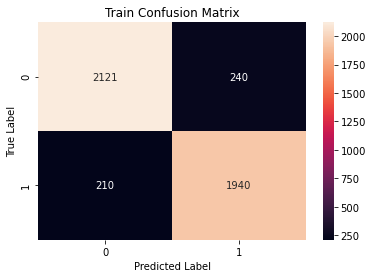

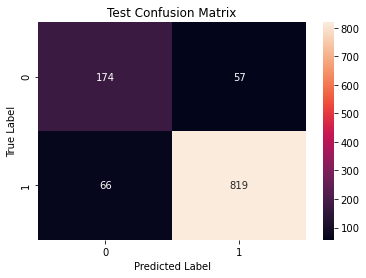

In [36]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
cm_train = confusion_matrix(labels_train, predictions_train)
cm_test = confusion_matrix(labels_val, predictions_val)
ax = plt.axes()
sn.heatmap(cm_train, annot = True, fmt = "d", ax = ax)
ax.set_title('Train Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()
ax = plt.axes()
sn.heatmap(cm_test, annot = True, fmt = "d", ax = ax)
ax.set_title('Test Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()

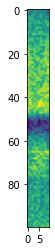

In [37]:
model = LogReg().to(device)
path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v3'
model.load_state_dict(torch.load('{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha)))
weights = model.linear.weight.view(100, 10)
plt.imshow(weights.detach().cpu())
plt.show()

In [38]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

tol = 0.01
learning_rate = 0.0005
num_epochs = 51
l2 = 0
alpha = 0.1

model = LogReg().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

cuda


Train loss for epoch 0: 0.6495121121406555
Val loss for epoch 0: 0.3954792320728302


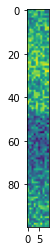

Train loss for epoch 1: 0.49682512879371643
Val loss for epoch 1: 0.36675190925598145
Train loss for epoch 2: 0.42510610818862915
Val loss for epoch 2: 0.35279929637908936
Train loss for epoch 3: 0.383651465177536
Val loss for epoch 3: 0.3319664001464844
Train loss for epoch 4: 0.36632832884788513
Val loss for epoch 4: 0.323133647441864
Train loss for epoch 5: 0.36409884691238403
Val loss for epoch 5: 0.31994906067848206


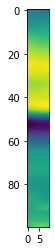

Train loss for epoch 6: 0.35380345582962036
Val loss for epoch 6: 0.3153507709503174
Train loss for epoch 7: 0.3509647250175476
Val loss for epoch 7: 0.34091392159461975
Train loss for epoch 8: 0.34773576259613037
Val loss for epoch 8: 0.33563748002052307
Train loss for epoch 9: 0.34706154465675354
Val loss for epoch 9: 0.3418563902378082
Train loss for epoch 10: 0.348570853471756
Val loss for epoch 10: 0.35239461064338684


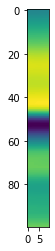

Train loss for epoch 11: 0.3458873927593231
Val loss for epoch 11: 0.31860098242759705
Train loss for epoch 12: 0.34472787380218506
Val loss for epoch 12: 0.3140793442726135
Train loss for epoch 13: 0.34326794743537903
Val loss for epoch 13: 0.3393777906894684
Train loss for epoch 14: 0.34050610661506653
Val loss for epoch 14: 0.3359350264072418
Train loss for epoch 15: 0.3400293290615082
Val loss for epoch 15: 0.33828848600387573


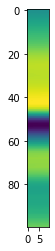

Train loss for epoch 16: 0.340886652469635
Val loss for epoch 16: 0.31026408076286316
Train loss for epoch 17: 0.3379623591899872
Val loss for epoch 17: 0.3346923887729645
Train loss for epoch 18: 0.33865171670913696
Val loss for epoch 18: 0.33271828293800354
Train loss for epoch 19: 0.3379758298397064
Val loss for epoch 19: 0.3095170855522156
Train loss for epoch 20: 0.338664710521698
Val loss for epoch 20: 0.3356809914112091


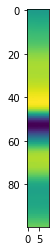

Train loss for epoch 21: 0.342301607131958
Val loss for epoch 21: 0.3044625222682953
Train loss for epoch 22: 0.3385348320007324
Val loss for epoch 22: 0.3062054514884949
Train loss for epoch 23: 0.33537545800209045
Val loss for epoch 23: 0.3175899088382721
Train loss for epoch 24: 0.3353365957736969
Val loss for epoch 24: 0.34985098242759705
Train loss for epoch 25: 0.3348751664161682
Val loss for epoch 25: 0.30380216240882874


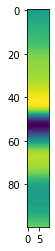

Train loss for epoch 26: 0.3360793888568878
Val loss for epoch 26: 0.32359811663627625
Train loss for epoch 27: 0.33413368463516235
Val loss for epoch 27: 0.31215518712997437
Train loss for epoch 28: 0.33563652634620667
Val loss for epoch 28: 0.31708213686943054
Train loss for epoch 29: 0.33261847496032715
Val loss for epoch 29: 0.3156868517398834
Train loss for epoch 30: 0.3372912108898163
Val loss for epoch 30: 0.3379169702529907


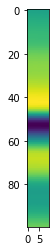

Train loss for epoch 31: 0.33361372351646423
Val loss for epoch 31: 0.3105628490447998
Train loss for epoch 32: 0.33660566806793213
Val loss for epoch 32: 0.3138869106769562
Train loss for epoch 33: 0.33363109827041626
Val loss for epoch 33: 0.36701056361198425
Train loss for epoch 34: 0.3353676199913025
Val loss for epoch 34: 0.3283243775367737
Train loss for epoch 35: 0.3363490104675293
Val loss for epoch 35: 0.31330153346061707


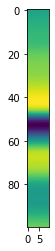

Train loss for epoch 36: 0.3326956331729889
Val loss for epoch 36: 0.3328796327114105
Train loss for epoch 37: 0.33395373821258545
Val loss for epoch 37: 0.3308030366897583
Train loss for epoch 38: 0.33385947346687317
Val loss for epoch 38: 0.32340043783187866
Train loss for epoch 39: 0.33393150568008423
Val loss for epoch 39: 0.31753039360046387
Train loss for epoch 40: 0.33634427189826965
Val loss for epoch 40: 0.3277958631515503


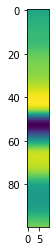

Train loss for epoch 41: 0.33706173300743103
Val loss for epoch 41: 0.3121929168701172
Train loss for epoch 42: 0.3359648585319519
Val loss for epoch 42: 0.3478125333786011
Train loss for epoch 43: 0.33344870805740356
Val loss for epoch 43: 0.31545785069465637
Train loss for epoch 44: 0.33273211121559143
Val loss for epoch 44: 0.33068692684173584
Train loss for epoch 45: 0.33287307620048523
Val loss for epoch 45: 0.3261442482471466


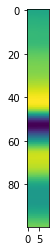

Train loss for epoch 46: 0.33569541573524475
Val loss for epoch 46: 0.30552199482917786
Train loss for epoch 47: 0.33537840843200684
Val loss for epoch 47: 0.33963972330093384
Train loss for epoch 48: 0.33345916867256165
Val loss for epoch 48: 0.30456891655921936
Train loss for epoch 49: 0.3343285918235779
Val loss for epoch 49: 0.3190944492816925
Train loss for epoch 50: 0.3335164189338684
Val loss for epoch 50: 0.3192501664161682


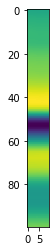

In [39]:
epochs = []
training_losses = []
training_acc = []
val_losses = []
validation_acc = []

train_predictions = []
validation_predictions = []
train_labels = []
validation_labels = []

for epoch in range(num_epochs):
    avg_train_loss, train_acc, train_preds, train_labs = train(epoch, alpha=alpha)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_acc, val_preds, val_labels = test(val_loader)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    if val_losses:
        if val_loss < min(val_losses):
            path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v3'
            torch.save(model.state_dict(), '{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha))
    if epoch%5 == 0:
        weights = model.linear.weight.view(100, 10)
        plt.imshow(weights.detach().cpu())
        plt.show()
    epochs.append(epoch)
    training_losses.append(avg_train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    
    train_predictions.append(train_preds)
    train_labels.append(train_labs)
    validation_predictions.append(val_preds)
    validation_labels.append(val_labels)
    
    if avg_train_loss < tol:
        break

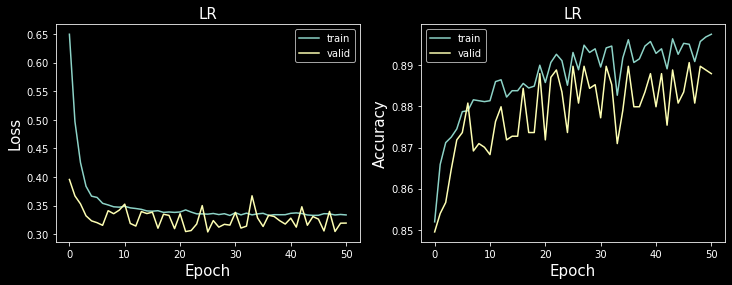

In [43]:
plt.style.use('dark_background')
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

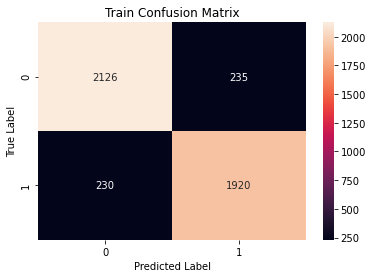

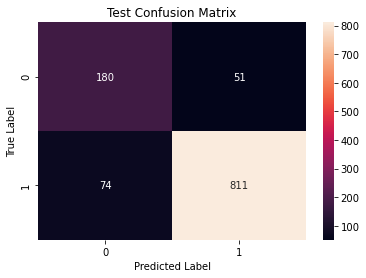

In [41]:
predictions_train = np.stack(train_predictions[-1:][0][:-1]).flatten()
labels_train = np.stack(train_labels[-1:][0][:-1]).flatten()
predictions_val = np.stack(validation_predictions[-1:][0][:-1]).flatten()
labels_val = np.stack(validation_labels[-1:][0][:-1]).flatten()

predictions_train = np.concatenate((predictions_train, train_predictions[-1:][0][-1:][0]))
labels_train = np.concatenate((labels_train, train_labels[-1:][0][-1:][0]))
predictions_val = np.concatenate((predictions_val, validation_predictions[-1:][0][-1:][0]))
labels_val = np.concatenate((labels_val, validation_labels[-1:][0][-1:][0]))

df_train = pd.DataFrame({'predictions': predictions_train, 'labels': labels_train})
df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

cm_train = confusion_matrix(labels_train, predictions_train)
cm_test = confusion_matrix(labels_val, predictions_val)
ax = plt.axes()
sn.heatmap(cm_train, annot = True, fmt = "d", ax = ax)
ax.set_title('Train Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()
ax = plt.axes()
sn.heatmap(cm_test, annot = True, fmt = "d", ax = ax)
ax.set_title('Test Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()

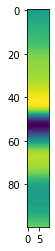

In [42]:
model = LogReg().to(device)
path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v3'
model.load_state_dict(torch.load('{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha)))
weights = model.linear.weight.view(100, 10)
plt.imshow(weights.detach().cpu())
plt.show()

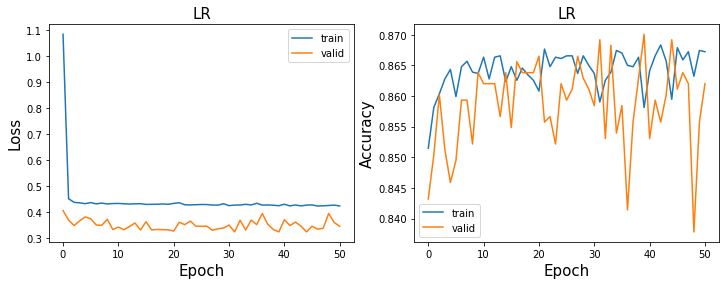

In [30]:
# alpha 1

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

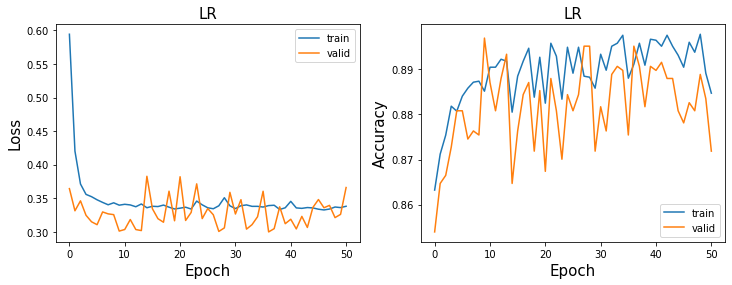

In [30]:
# alpha 0.1

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

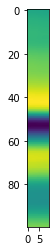

In [31]:
model = LogReg().to(device)
path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v3'
model.load_state_dict(torch.load('{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha)))
weights = model.linear.weight.view(100, 10)
plt.imshow(weights.detach().cpu())
plt.show()

In [31]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

tol = 0.01
learning_rate = 0.001
num_epochs = 51
l2 = 1
alpha = 0

model = LogReg().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=l2)

cuda


Train loss for epoch 0: 0.4758768677711487
Val loss for epoch 0: 0.37519246339797974


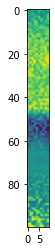

Train loss for epoch 1: 0.40990886092185974
Val loss for epoch 1: 0.39294856786727905
Train loss for epoch 2: 0.4099070131778717
Val loss for epoch 2: 0.40231791138648987
Train loss for epoch 3: 0.4084826111793518
Val loss for epoch 3: 0.37864336371421814
Train loss for epoch 4: 0.4070426821708679
Val loss for epoch 4: 0.37240567803382874
Train loss for epoch 5: 0.4089435040950775
Val loss for epoch 5: 0.36679527163505554


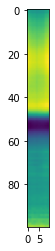

Train loss for epoch 6: 0.4104519486427307
Val loss for epoch 6: 0.37248435616493225
Train loss for epoch 7: 0.408695787191391
Val loss for epoch 7: 0.46120893955230713
Train loss for epoch 8: 0.40926963090896606
Val loss for epoch 8: 0.37953490018844604
Train loss for epoch 9: 0.4086422324180603
Val loss for epoch 9: 0.40385138988494873
Train loss for epoch 10: 0.4081164300441742
Val loss for epoch 10: 0.4476303458213806


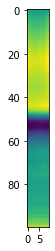

Train loss for epoch 11: 0.405248761177063
Val loss for epoch 11: 0.35673749446868896
Train loss for epoch 12: 0.41416212916374207
Val loss for epoch 12: 0.38521823287010193
Train loss for epoch 13: 0.4066069424152374
Val loss for epoch 13: 0.35797515511512756
Train loss for epoch 14: 0.40966954827308655
Val loss for epoch 14: 0.3433501124382019
Train loss for epoch 15: 0.4063017666339874
Val loss for epoch 15: 0.37839826941490173


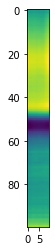

Train loss for epoch 16: 0.4052763879299164
Val loss for epoch 16: 0.36013561487197876
Train loss for epoch 17: 0.41212955117225647
Val loss for epoch 17: 0.35362574458122253
Train loss for epoch 18: 0.40583300590515137
Val loss for epoch 18: 0.3798639476299286
Train loss for epoch 19: 0.40832599997520447
Val loss for epoch 19: 0.34750112891197205
Train loss for epoch 20: 0.4062822163105011
Val loss for epoch 20: 0.39715906977653503


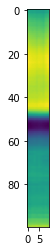

Train loss for epoch 21: 0.41070643067359924
Val loss for epoch 21: 0.35177311301231384
Train loss for epoch 22: 0.4117410480976105
Val loss for epoch 22: 0.36639150977134705
Train loss for epoch 23: 0.4111005663871765
Val loss for epoch 23: 0.350938081741333
Train loss for epoch 24: 0.40831705927848816
Val loss for epoch 24: 0.3506167232990265
Train loss for epoch 25: 0.40724262595176697
Val loss for epoch 25: 0.3903334438800812


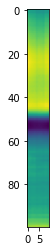

Train loss for epoch 26: 0.4070028066635132
Val loss for epoch 26: 0.3751266896724701
Train loss for epoch 27: 0.4080251157283783
Val loss for epoch 27: 0.42137327790260315
Train loss for epoch 28: 0.4154489040374756
Val loss for epoch 28: 0.472284734249115
Train loss for epoch 29: 0.4071292579174042
Val loss for epoch 29: 0.3838270902633667
Train loss for epoch 30: 0.41145336627960205
Val loss for epoch 30: 0.39551061391830444


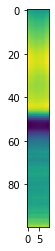

Train loss for epoch 31: 0.40869230031967163
Val loss for epoch 31: 0.4007546603679657
Train loss for epoch 32: 0.4124598801136017
Val loss for epoch 32: 0.3597447872161865
Train loss for epoch 33: 0.4075838029384613
Val loss for epoch 33: 0.34249284863471985
Train loss for epoch 34: 0.4133383631706238
Val loss for epoch 34: 0.4268064796924591
Train loss for epoch 35: 0.40829330682754517
Val loss for epoch 35: 0.37271037697792053


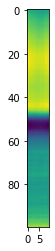

Train loss for epoch 36: 0.40916815400123596
Val loss for epoch 36: 0.35603538155555725
Train loss for epoch 37: 0.41009363532066345
Val loss for epoch 37: 0.35273638367652893
Train loss for epoch 38: 0.40652185678482056
Val loss for epoch 38: 0.3843594789505005
Train loss for epoch 39: 0.4037027955055237
Val loss for epoch 39: 0.37748321890830994
Train loss for epoch 40: 0.40623271465301514
Val loss for epoch 40: 0.3595917522907257


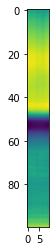

Train loss for epoch 41: 0.40995949506759644
Val loss for epoch 41: 0.4903802275657654
Train loss for epoch 42: 0.40773555636405945
Val loss for epoch 42: 0.39210325479507446
Train loss for epoch 43: 0.419512540102005
Val loss for epoch 43: 0.36720407009124756
Train loss for epoch 44: 0.4088861048221588
Val loss for epoch 44: 0.3531796932220459
Train loss for epoch 45: 0.4094192683696747
Val loss for epoch 45: 0.4007439613342285


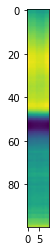

Train loss for epoch 46: 0.40310871601104736
Val loss for epoch 46: 0.3766046464443207
Train loss for epoch 47: 0.4069158434867859
Val loss for epoch 47: 0.3614797294139862
Train loss for epoch 48: 0.40661555528640747
Val loss for epoch 48: 0.36525076627731323
Train loss for epoch 49: 0.4142436981201172
Val loss for epoch 49: 0.36154451966285706
Train loss for epoch 50: 0.4077760577201843
Val loss for epoch 50: 0.5078045725822449


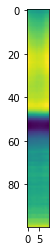

In [32]:
epochs = []
training_losses = []
training_acc = []
val_losses = []
validation_acc = []
for epoch in range(num_epochs):
    avg_train_loss, train_acc = train(epoch, alpha=alpha)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_acc = test(val_loader)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    if val_losses:
        if val_loss < min(val_losses):
            path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v3'
            torch.save(model.state_dict(), '{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha))
    if epoch%5 == 0:
        weights = model.linear.weight.view(100, 10)
        plt.imshow(weights.detach().cpu())
        plt.show()
    epochs.append(epoch)
    training_losses.append(avg_train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if avg_train_loss < tol:
        break

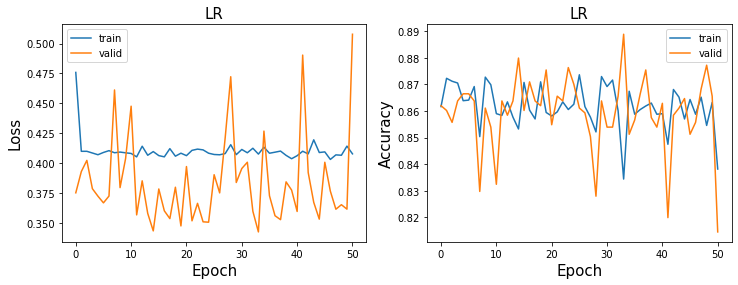

In [33]:
# l2 1

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

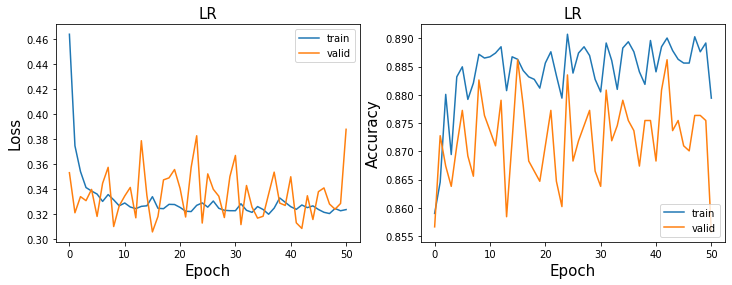

In [34]:
# l2 0.1

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

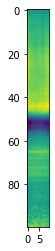

In [35]:
model = LogReg().to(device)
path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v3'
model.load_state_dict(torch.load('{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha)))
weights = model.linear.weight.view(100, 10)
plt.imshow(weights.detach().cpu())
plt.show()

### Spec_dataloader

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn.functional import relu
from scipy.io import loadmat
import os
from os import listdir
import pandas as pd
from skimage import io
from PIL import Image

from utils import *

In [2]:
train_loader, val_loader = create_dataloaders(batch_size=128, version='v5', CH=0)

In [3]:
for batch_idx, (data, labels, date, rec) in enumerate(train_loader):
    print(data.shape)
    print(labels.shape)
    print(len(date))
    print(len(rec))
    break

torch.Size([128, 1, 100, 10])
torch.Size([128, 1])
128
128


date:180327, rec:001
date:180409, rec:003


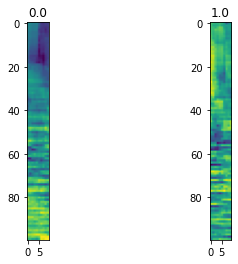

In [10]:
for batch_idx, (data, labels, date, rec) in enumerate(train_loader):
    print('date:{}, rec:{}'.format(date[0], rec[0]))
    data_sub = data[0][0]
    # plt.axis('off')
    plt.subplot(1,2,1)
    plt.imshow(data_sub)
    plt.title(labels[0][0].numpy())
    # plt.clim(-1, 1)
    # plt.show()
    break
for batch_idx, (data, labels, date, rec) in enumerate(train_loader):
    print('date:{}, rec:{}'.format(date[0], rec[0]))
    data_sub = data[0][0]
    # plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(data_sub)
    plt.title(labels[0][0].numpy())
    # plt.clim(-1, 1)
    plt.show()
    break

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

tol = 0.01
learning_rate = 0.001
num_epochs = 51
l2 = 0
alpha = 0
CH = 0

model = LogReg(input_dim=100*10, output_dim=1).to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

cuda


Train loss for epoch 0: 0.43267881870269775
Val loss for epoch 0: 0.49871861934661865


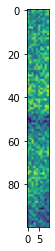

Train loss for epoch 1: 0.4304124712944031
Val loss for epoch 1: 0.4955293834209442
Train loss for epoch 2: 0.4255128502845764
Val loss for epoch 2: 0.5003490447998047
Train loss for epoch 3: 0.4188004434108734
Val loss for epoch 3: 0.49092337489128113
Train loss for epoch 4: 0.41509902477264404
Val loss for epoch 4: 0.49032923579216003
Train loss for epoch 5: 0.40872690081596375
Val loss for epoch 5: 0.4809701442718506
Train loss for epoch 6: 0.4120285212993622
Val loss for epoch 6: 0.48850351572036743
Train loss for epoch 7: 0.40842145681381226
Val loss for epoch 7: 0.4849555790424347
Train loss for epoch 8: 0.4013078510761261
Val loss for epoch 8: 0.47671055793762207
Train loss for epoch 9: 0.4014965295791626
Val loss for epoch 9: 0.48770418763160706
Train loss for epoch 10: 0.39965710043907166
Val loss for epoch 10: 0.4848616123199463


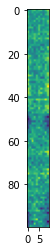

Train loss for epoch 11: 0.39551714062690735
Val loss for epoch 11: 0.4860931634902954
Train loss for epoch 12: 0.3985292613506317
Val loss for epoch 12: 0.4852624237537384
Train loss for epoch 13: 0.39467427134513855
Val loss for epoch 13: 0.4791925251483917
Train loss for epoch 14: 0.401323139667511
Val loss for epoch 14: 0.48838701844215393
Train loss for epoch 15: 0.4036813974380493
Val loss for epoch 15: 0.4749794006347656
Train loss for epoch 16: 0.39422184228897095
Val loss for epoch 16: 0.4833170175552368
Train loss for epoch 17: 0.3981104791164398
Val loss for epoch 17: 0.4756975769996643
Train loss for epoch 18: 0.3940291702747345
Val loss for epoch 18: 0.47805967926979065
Train loss for epoch 19: 0.389841228723526
Val loss for epoch 19: 0.47470182180404663
Train loss for epoch 20: 0.3923737704753876
Val loss for epoch 20: 0.48360639810562134


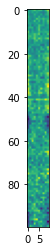

Train loss for epoch 21: 0.3919855058193207
Val loss for epoch 21: 0.4802659749984741
Train loss for epoch 22: 0.3897996246814728
Val loss for epoch 22: 0.4805944561958313
Train loss for epoch 23: 0.38685342669487
Val loss for epoch 23: 0.48443639278411865
Train loss for epoch 24: 0.3897617757320404
Val loss for epoch 24: 0.48075079917907715
Train loss for epoch 25: 0.3899431824684143
Val loss for epoch 25: 0.4800058603286743
Train loss for epoch 26: 0.39005616307258606
Val loss for epoch 26: 0.48436886072158813
Train loss for epoch 27: 0.38839948177337646
Val loss for epoch 27: 0.48602455854415894
Train loss for epoch 28: 0.3900013267993927
Val loss for epoch 28: 0.49888932704925537
Train loss for epoch 29: 0.3883988559246063
Val loss for epoch 29: 0.4869453012943268
Train loss for epoch 30: 0.3882600963115692
Val loss for epoch 30: 0.48131081461906433


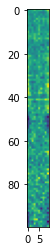

KeyboardInterrupt: 

In [6]:
epochs = []
training_losses = []
training_acc = []
val_losses = []
validation_acc = []
for epoch in range(num_epochs):
    avg_train_loss, train_acc = train(model, criterion, optimizer, train_loader, epoch, alpha=alpha)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_acc = test(model, criterion, optimizer, val_loader)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    if val_losses:
        if val_loss < min(val_losses):
            path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v5'
            torch.save(model.state_dict(), '{}/lr_CH{}_reg{}_alpha{}.pt'.format(path, CH, l2, alpha))
    if epoch%10 == 0:
        weights = model.linear.weight.view(100, 10).detach().cpu()
        plt.imshow(weights)
            # plt.clim(-0.03, 0.03)
        plt.show()
    epochs.append(epoch)
    training_losses.append(avg_train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if avg_train_loss < tol:
        break

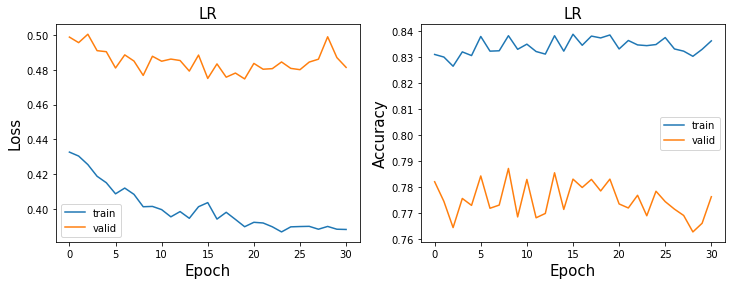

In [7]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

date:180409, rec:003


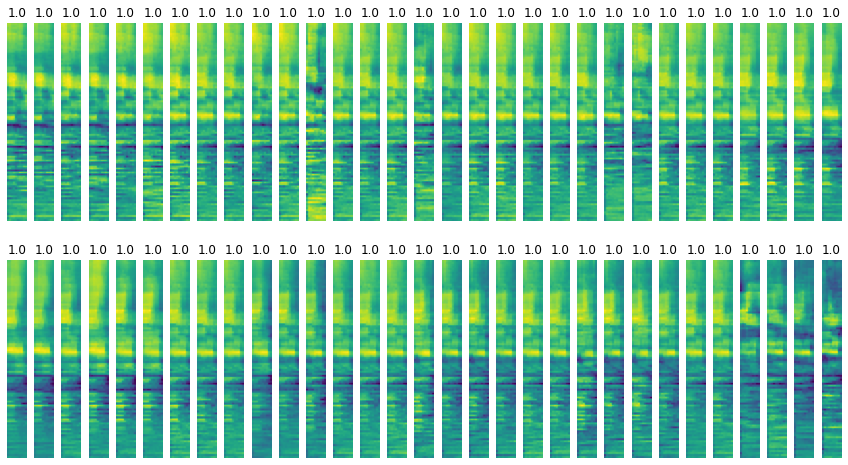

In [6]:
for batch_idx, (data, labels, date, rec) in enumerate(train_loader):
    print('date:{}, rec:{}'.format(date[0], rec[0]))
    plt.figure(figsize=(15,8))
    for i in range(62):
        data_sub = data[0][0][i]
        plt.subplot(2,31,i+1)
        plt.axis('off')
        plt.imshow(data_sub)
        plt.title(labels[0][0].numpy())
        # plt.clim(-1, 1)
    plt.show()
    break

date:180327, rec:004


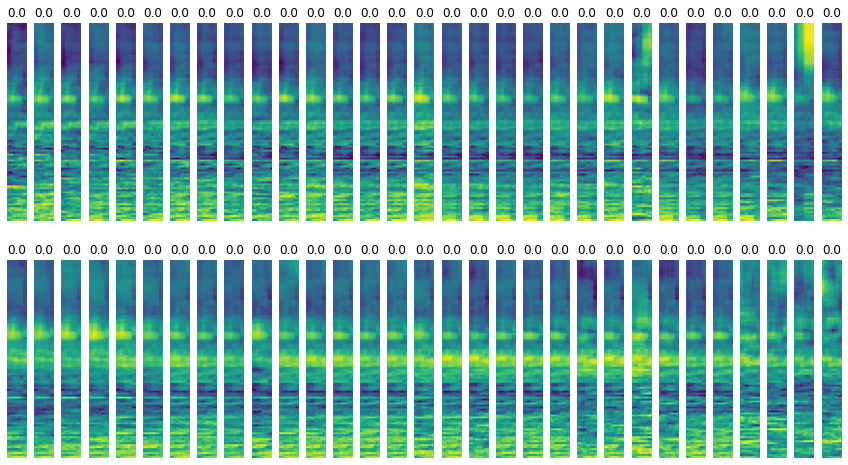

In [7]:
for batch_idx, (data, labels, date, rec) in enumerate(train_loader):
    print('date:{}, rec:{}'.format(date[0], rec[0]))
    plt.figure(figsize=(15,8))
    for i in range(62):
        data_sub = data[0][i]
        plt.subplot(2,31,i+1)
        plt.axis('off')
        plt.imshow(data_sub)
        plt.title(labels[0][0].numpy())
        # plt.clim(-1, 1)
    plt.show()
    break

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

tol = 0.01
learning_rate = 0.001
num_epochs = 51
l2 = 0
alpha = 0

model = LogReg().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

cuda


Train loss for epoch 0: 2.7426693439483643
Val loss for epoch 0: 1.1473972797393799


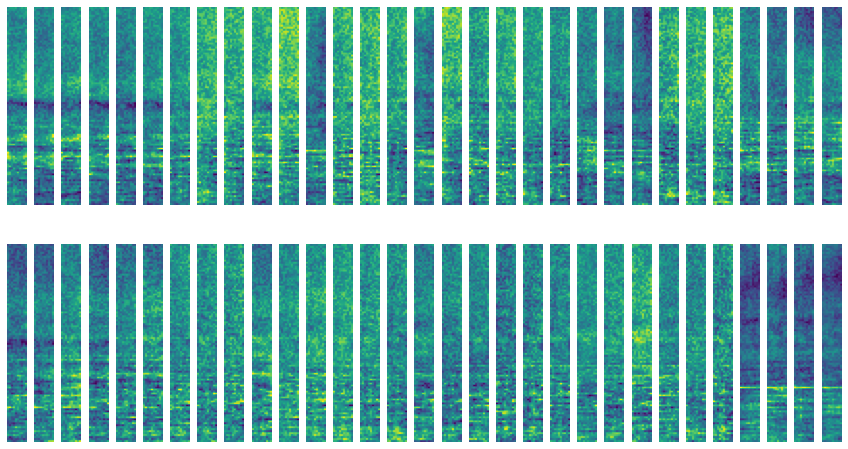

Train loss for epoch 1: 0.9063826203346252
Val loss for epoch 1: 0.8994390368461609
Train loss for epoch 2: 0.6067533493041992
Val loss for epoch 2: 1.065423846244812
Train loss for epoch 3: 0.5125554203987122
Val loss for epoch 3: 1.1662427186965942
Train loss for epoch 4: 0.34216418862342834
Val loss for epoch 4: 0.7818918228149414
Train loss for epoch 5: 0.3489600419998169
Val loss for epoch 5: 1.4111526012420654
Train loss for epoch 6: 0.35250017046928406
Val loss for epoch 6: 0.9188125729560852
Train loss for epoch 7: 0.31520113348960876
Val loss for epoch 7: 0.9274235963821411
Train loss for epoch 8: 0.35550710558891296
Val loss for epoch 8: 0.8562808036804199
Train loss for epoch 9: 0.4538179636001587
Val loss for epoch 9: 1.7752424478530884
Train loss for epoch 10: 0.4191628098487854
Val loss for epoch 10: 0.9146385788917542


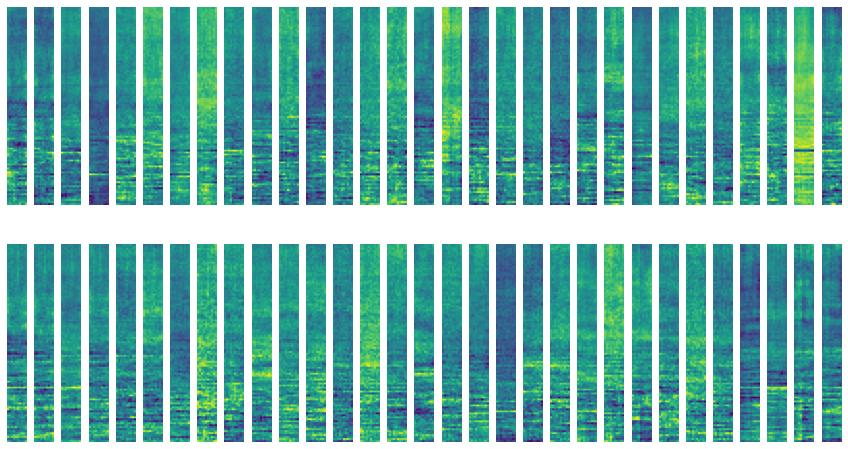

Train loss for epoch 11: 0.38120219111442566
Val loss for epoch 11: 1.333333134651184
Train loss for epoch 12: 0.6681755781173706
Val loss for epoch 12: 1.3236969709396362
Train loss for epoch 13: 0.35702070593833923
Val loss for epoch 13: 1.4827139377593994
Train loss for epoch 14: 0.3336907625198364
Val loss for epoch 14: 1.0344948768615723
Train loss for epoch 15: 0.326617956161499
Val loss for epoch 15: 1.1805356740951538
Train loss for epoch 16: 0.3144471049308777
Val loss for epoch 16: 1.1925171613693237
Train loss for epoch 17: 0.25217851996421814
Val loss for epoch 17: 1.1197036504745483
Train loss for epoch 18: 0.22920481860637665
Val loss for epoch 18: 1.1517839431762695
Train loss for epoch 19: 0.2505524158477783
Val loss for epoch 19: 1.2485933303833008
Train loss for epoch 20: 0.23341068625450134
Val loss for epoch 20: 1.5540515184402466


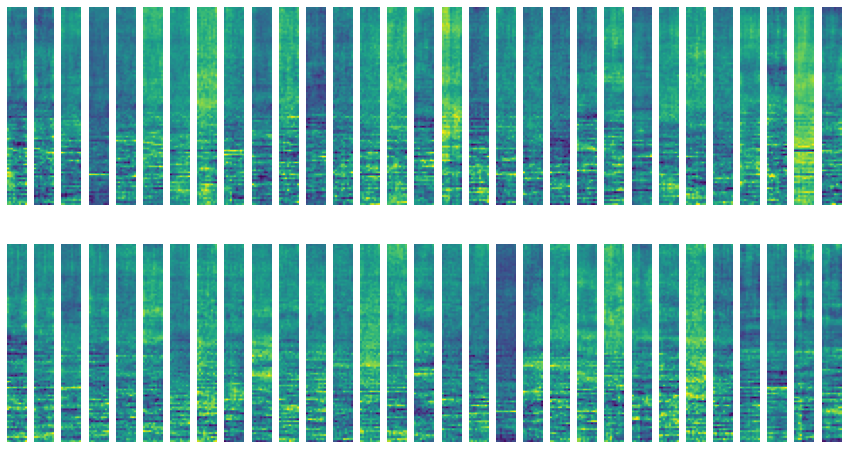

Train loss for epoch 21: 0.23781242966651917
Val loss for epoch 21: 1.1274000406265259
Train loss for epoch 22: 0.21153277158737183
Val loss for epoch 22: 1.3033910989761353
Train loss for epoch 23: 0.22125662863254547
Val loss for epoch 23: 2.0149104595184326
Train loss for epoch 24: 0.5381335616111755
Val loss for epoch 24: 1.5818718671798706
Train loss for epoch 25: 0.1905251294374466
Val loss for epoch 25: 1.2394928932189941
Train loss for epoch 26: 0.28068917989730835
Val loss for epoch 26: 1.5896743535995483
Train loss for epoch 27: 0.2565705478191376
Val loss for epoch 27: 1.388900637626648
Train loss for epoch 28: 0.1604071408510208
Val loss for epoch 28: 1.2575488090515137
Train loss for epoch 29: 0.15744611620903015
Val loss for epoch 29: 1.5007097721099854
Train loss for epoch 30: 0.1625857949256897
Val loss for epoch 30: 1.389404058456421


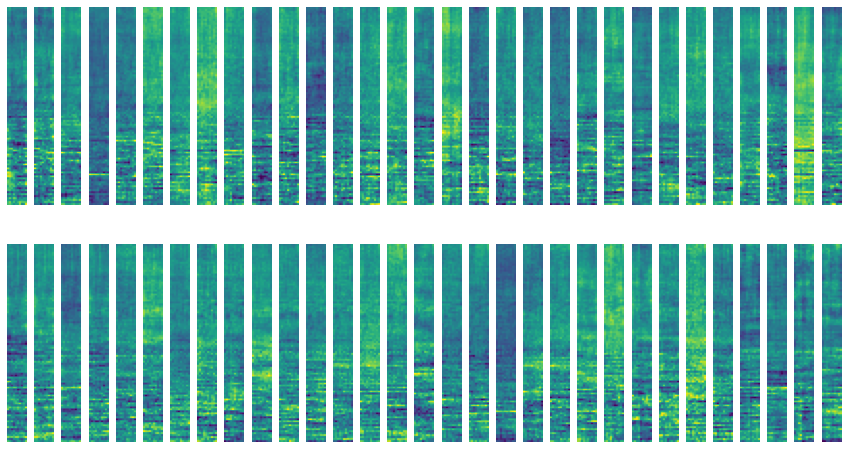

Train loss for epoch 31: 0.24340683221817017
Val loss for epoch 31: 1.34162437915802
Train loss for epoch 32: 0.16261564195156097
Val loss for epoch 32: 1.3899266719818115
Train loss for epoch 33: 0.17293982207775116
Val loss for epoch 33: 1.514581561088562
Train loss for epoch 34: 0.1640615165233612
Val loss for epoch 34: 1.3854013681411743
Train loss for epoch 35: 0.2612531781196594
Val loss for epoch 35: 1.671392798423767
Train loss for epoch 36: 0.18197448551654816
Val loss for epoch 36: 1.5418401956558228
Train loss for epoch 37: 0.14749270677566528
Val loss for epoch 37: 1.594800591468811
Train loss for epoch 38: 0.2307955026626587
Val loss for epoch 38: 2.650115966796875
Train loss for epoch 39: 0.5405395030975342
Val loss for epoch 39: 3.0495550632476807
Train loss for epoch 40: 0.30801713466644287
Val loss for epoch 40: 1.7384552955627441


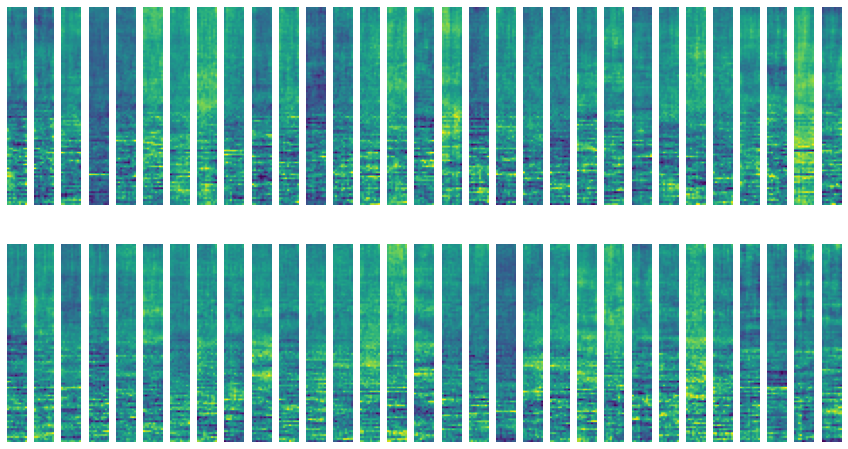

Train loss for epoch 41: 0.2426150143146515
Val loss for epoch 41: 2.5154592990875244
Train loss for epoch 42: 0.26040518283843994
Val loss for epoch 42: 1.7121080160140991
Train loss for epoch 43: 0.15339374542236328
Val loss for epoch 43: 1.8731255531311035
Train loss for epoch 44: 0.36726754903793335
Val loss for epoch 44: 2.0611209869384766
Train loss for epoch 45: 0.1738198697566986
Val loss for epoch 45: 1.848496913909912
Train loss for epoch 46: 0.09607430547475815
Val loss for epoch 46: 1.820070743560791
Train loss for epoch 47: 0.10510227084159851
Val loss for epoch 47: 1.7490171194076538
Train loss for epoch 48: 0.08221907913684845
Val loss for epoch 48: 1.721514105796814
Train loss for epoch 49: 0.10426550358533859
Val loss for epoch 49: 1.744165301322937
Train loss for epoch 50: 0.20769913494586945
Val loss for epoch 50: 2.0062754154205322


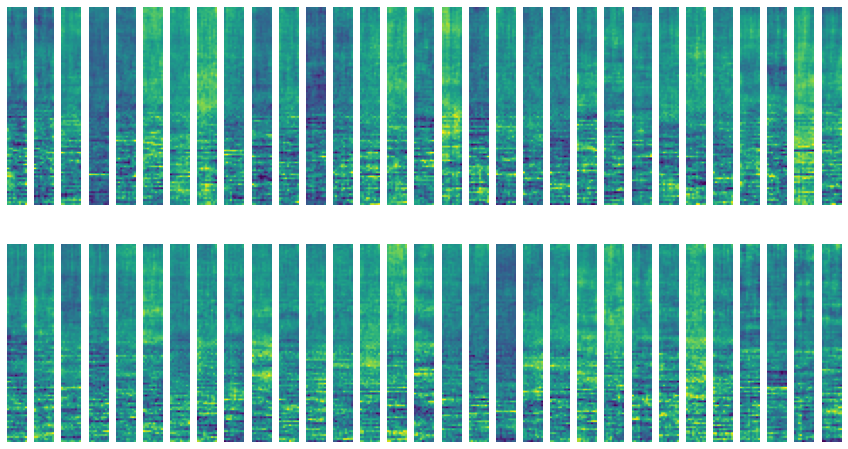

In [11]:
epochs = []
training_losses = []
training_acc = []
val_losses = []
validation_acc = []
for epoch in range(num_epochs):
    avg_train_loss, train_acc = train(model, criterion, optimizer, train_loader, epoch, alpha=alpha)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_acc = test(model, criterion, optimizer, val_loader)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    if val_losses:
        if val_loss < min(val_losses):
            path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v5'
            torch.save(model.state_dict(), '{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha))
    if epoch%10 == 0:
        weights = model.linear.weight.view(62, 100, 10)
        plt.figure(figsize=(15,8))
        for i in range(62):
            weights_sub = weights[i].detach().cpu()
            plt.subplot(2,31,i+1)
            plt.axis('off')
            plt.imshow(weights_sub)
            # plt.clim(-0.03, 0.03)
        plt.show()
    epochs.append(epoch)
    training_losses.append(avg_train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if avg_train_loss < tol:
        break

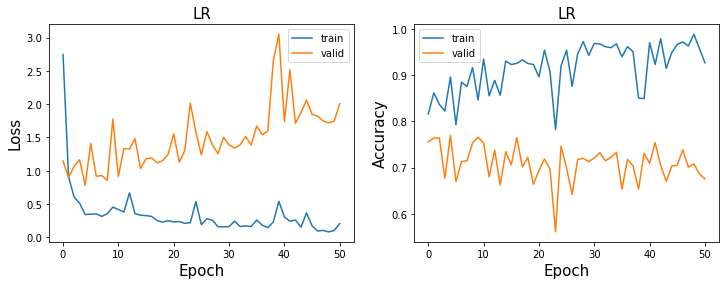

In [12]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

In [13]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

tol = 0.01
learning_rate = 0.001
num_epochs = 51
l2 = 0
alpha = 0.1

model = LogReg().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

cuda


Train loss for epoch 0: 1.19882071018219
Val loss for epoch 0: 1.1865853071212769


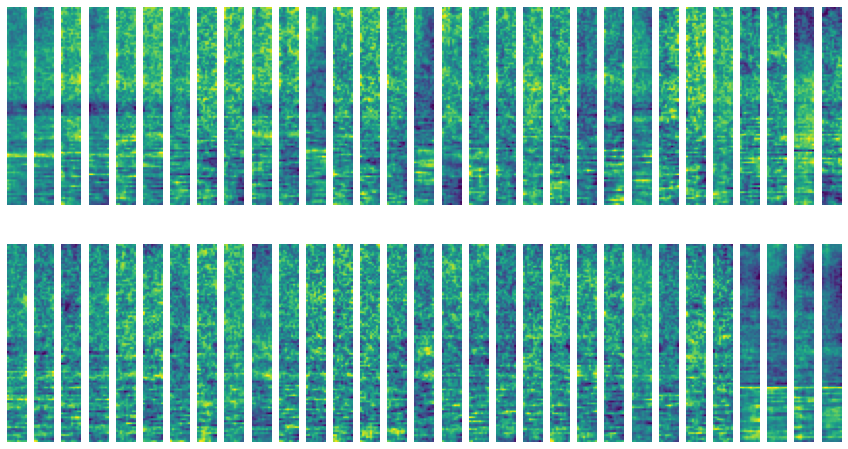

Train loss for epoch 1: 0.926102876663208
Val loss for epoch 1: 0.7496535181999207
Train loss for epoch 2: 0.5298546552658081
Val loss for epoch 2: 0.9229856729507446
Train loss for epoch 3: 0.5525145530700684
Val loss for epoch 3: 0.9569810628890991
Train loss for epoch 4: 0.6411596536636353
Val loss for epoch 4: 0.8730577826499939
Train loss for epoch 5: 0.5733473300933838
Val loss for epoch 5: 0.7746092677116394
Train loss for epoch 6: 0.49001002311706543
Val loss for epoch 6: 0.9870834946632385
Train loss for epoch 7: 0.5247370600700378
Val loss for epoch 7: 1.3006856441497803
Train loss for epoch 8: 0.5712499618530273
Val loss for epoch 8: 0.890352189540863
Train loss for epoch 9: 0.6071718335151672
Val loss for epoch 9: 0.8951169848442078
Train loss for epoch 10: 0.630515992641449
Val loss for epoch 10: 0.8484516739845276


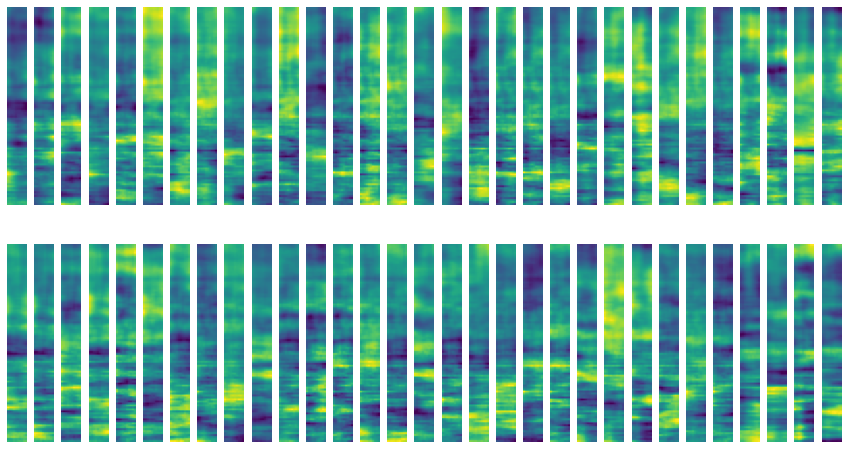

Train loss for epoch 11: 0.5353972315788269
Val loss for epoch 11: 0.9128008484840393
Train loss for epoch 12: 0.5990897417068481
Val loss for epoch 12: 0.9380690455436707
Train loss for epoch 13: 0.6373909115791321
Val loss for epoch 13: 1.2755893468856812
Train loss for epoch 14: 0.6342679858207703
Val loss for epoch 14: 1.2555838823318481
Train loss for epoch 15: 0.7655417323112488
Val loss for epoch 15: 1.0418355464935303
Train loss for epoch 16: 0.45548972487449646
Val loss for epoch 16: 0.8586246967315674
Train loss for epoch 17: 0.4443567991256714
Val loss for epoch 17: 0.8012757897377014
Train loss for epoch 18: 0.512410044670105
Val loss for epoch 18: 0.8748908042907715
Train loss for epoch 19: 0.4877958297729492
Val loss for epoch 19: 0.9549316167831421
Train loss for epoch 20: 0.4241144061088562
Val loss for epoch 20: 0.8811433911323547


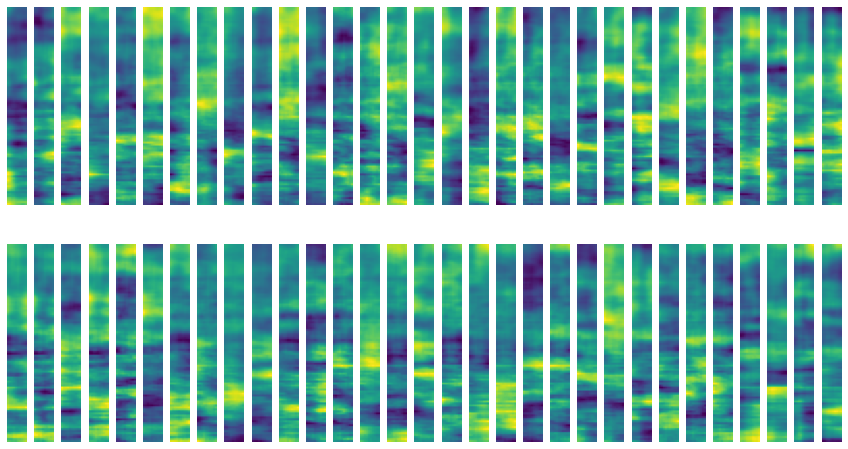

Train loss for epoch 21: 0.5184149146080017
Val loss for epoch 21: 0.8534223437309265
Train loss for epoch 22: 0.6613829135894775
Val loss for epoch 22: 0.978268563747406
Train loss for epoch 23: 0.5363727807998657
Val loss for epoch 23: 0.9469372034072876
Train loss for epoch 24: 0.72242271900177
Val loss for epoch 24: 1.3554176092147827
Train loss for epoch 25: 0.518301784992218
Val loss for epoch 25: 1.071825385093689
Train loss for epoch 26: 0.4639604389667511
Val loss for epoch 26: 1.0417102575302124
Train loss for epoch 27: 0.4838126301765442
Val loss for epoch 27: 1.0593925714492798
Train loss for epoch 28: 0.42055806517601013
Val loss for epoch 28: 1.5319862365722656
Train loss for epoch 29: 0.5439766049385071
Val loss for epoch 29: 1.1206303834915161
Train loss for epoch 30: 0.5457167625427246
Val loss for epoch 30: 1.7171982526779175


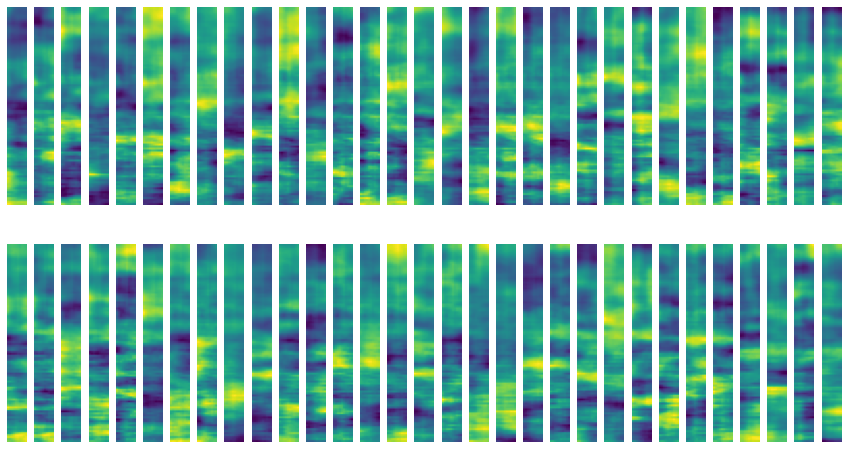

Train loss for epoch 31: 0.6428676843643188
Val loss for epoch 31: 0.974330723285675
Train loss for epoch 32: 0.5116544365882874
Val loss for epoch 32: 1.0886343717575073
Train loss for epoch 33: 0.5089851021766663
Val loss for epoch 33: 1.0409821271896362
Train loss for epoch 34: 0.5658011436462402
Val loss for epoch 34: 1.827665090560913
Train loss for epoch 35: 0.6311320662498474
Val loss for epoch 35: 1.5323303937911987
Train loss for epoch 36: 0.6156595945358276
Val loss for epoch 36: 1.0571444034576416
Train loss for epoch 37: 0.6300718188285828
Val loss for epoch 37: 1.220292091369629
Train loss for epoch 38: 0.5217207670211792
Val loss for epoch 38: 1.7980749607086182
Train loss for epoch 39: 0.5389353036880493
Val loss for epoch 39: 1.1758818626403809
Train loss for epoch 40: 0.7069583535194397
Val loss for epoch 40: 1.2182996273040771


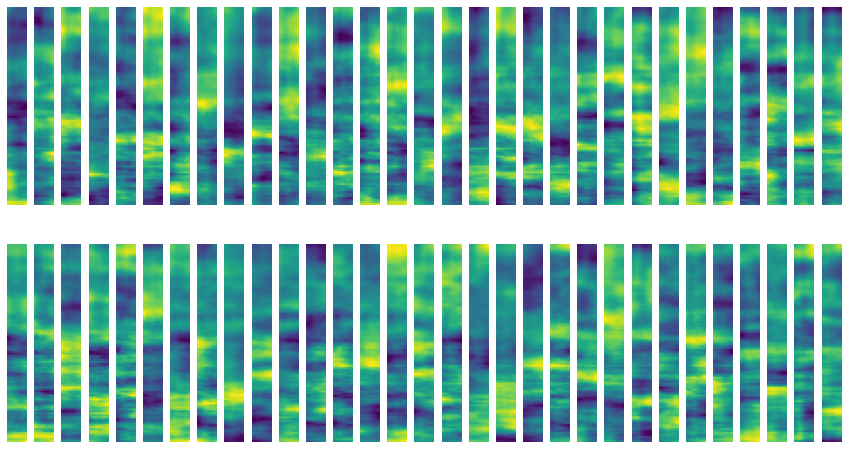

Train loss for epoch 41: 0.5006766319274902
Val loss for epoch 41: 1.1198616027832031
Train loss for epoch 42: 0.4892358183860779
Val loss for epoch 42: 1.3157157897949219
Train loss for epoch 43: 0.4818718731403351
Val loss for epoch 43: 1.2596163749694824
Train loss for epoch 44: 0.5441755652427673
Val loss for epoch 44: 1.063767671585083
Train loss for epoch 45: 0.5550391674041748
Val loss for epoch 45: 1.367377519607544
Train loss for epoch 46: 0.5113312602043152
Val loss for epoch 46: 1.6475082635879517
Train loss for epoch 47: 0.573602020740509
Val loss for epoch 47: 1.2798634767532349
Train loss for epoch 48: 0.6022149324417114
Val loss for epoch 48: 1.1112968921661377
Train loss for epoch 49: 0.7212532758712769
Val loss for epoch 49: 1.0291486978530884
Train loss for epoch 50: 0.4606103301048279
Val loss for epoch 50: 1.1738284826278687


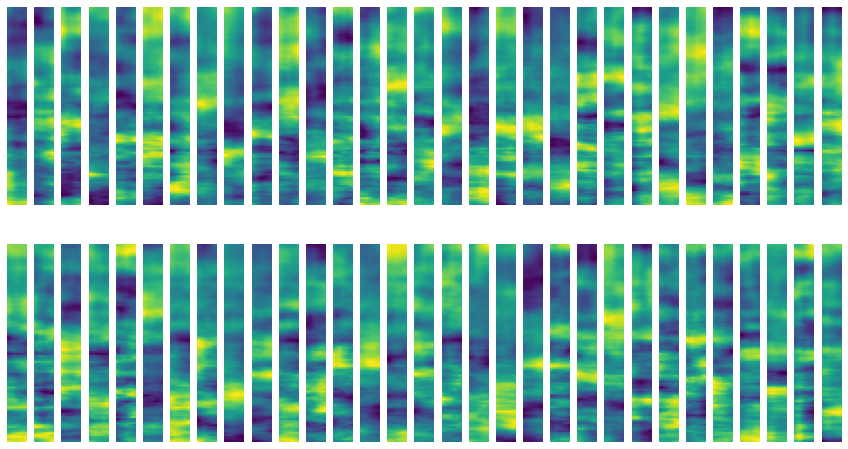

In [14]:
epochs = []
training_losses = []
training_acc = []
val_losses = []
validation_acc = []
for epoch in range(num_epochs):
    avg_train_loss, train_acc = train(model, criterion, optimizer, train_loader, epoch, alpha=alpha)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_acc = test(model, criterion, optimizer, val_loader)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    if val_losses:
        if val_loss < min(val_losses):
            path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v5'
            torch.save(model.state_dict(), '{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha))
    if epoch%10 == 0:
        weights = model.linear.weight.view(62, 100, 10)
        plt.figure(figsize=(15,8))
        for i in range(62):
            weights_sub = weights[i].detach().cpu()
            plt.subplot(2,31,i+1)
            plt.axis('off')
            plt.imshow(weights_sub)
            # plt.clim(-0.03, 0.03)
        plt.show()
    epochs.append(epoch)
    training_losses.append(avg_train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if avg_train_loss < tol:
        break

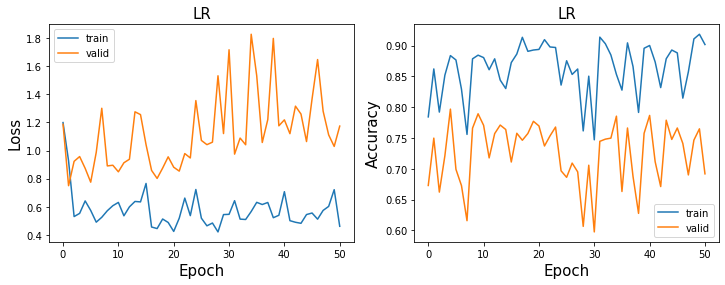

In [15]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()

In [16]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

tol = 0.01
learning_rate = 0.001
num_epochs = 51
l2 = 0.1
alpha = 0

model = LogReg().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate, weight_decay=l2)

cuda


Train loss for epoch 0: 1.2955482006072998
Val loss for epoch 0: 0.9846248030662537


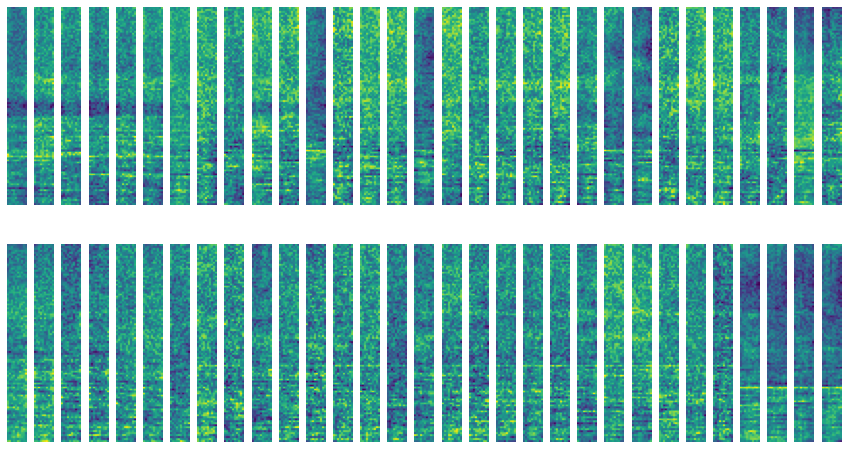

Train loss for epoch 1: 0.5564877390861511
Val loss for epoch 1: 0.8820741772651672
Train loss for epoch 2: 0.5175222754478455
Val loss for epoch 2: 1.1385501623153687
Train loss for epoch 3: 0.5276846289634705
Val loss for epoch 3: 1.0246622562408447
Train loss for epoch 4: 0.49445170164108276
Val loss for epoch 4: 0.8390576243400574
Train loss for epoch 5: 0.412687212228775
Val loss for epoch 5: 0.8462400436401367
Train loss for epoch 6: 0.4194857180118561
Val loss for epoch 6: 0.8336424231529236
Train loss for epoch 7: 0.4090767800807953
Val loss for epoch 7: 0.8848399519920349
Train loss for epoch 8: 0.43288159370422363
Val loss for epoch 8: 0.9189773201942444
Train loss for epoch 9: 0.4479597210884094
Val loss for epoch 9: 0.7413973212242126
Train loss for epoch 10: 0.3494678735733032
Val loss for epoch 10: 1.0956230163574219


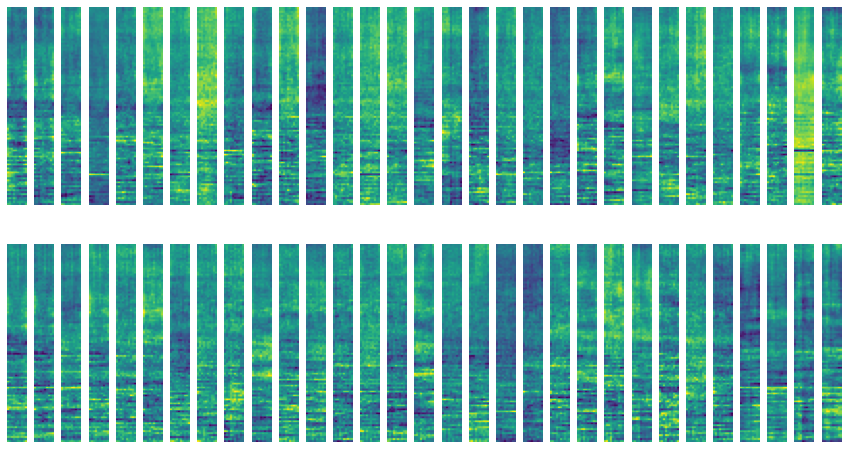

Train loss for epoch 11: 0.3804401159286499
Val loss for epoch 11: 1.024035930633545
Train loss for epoch 12: 0.4592215418815613
Val loss for epoch 12: 0.8216802477836609
Train loss for epoch 13: 0.3744162917137146
Val loss for epoch 13: 1.0513030290603638
Train loss for epoch 14: 0.43697696924209595
Val loss for epoch 14: 1.2060837745666504
Train loss for epoch 15: 0.486457496881485
Val loss for epoch 15: 0.7855897545814514
Train loss for epoch 16: 0.4499337673187256
Val loss for epoch 16: 0.718407392501831
Train loss for epoch 17: 0.3215383291244507
Val loss for epoch 17: 0.6835082173347473
Train loss for epoch 18: 0.38051682710647583
Val loss for epoch 18: 1.2784994840621948
Train loss for epoch 19: 0.550125241279602
Val loss for epoch 19: 0.8789981603622437
Train loss for epoch 20: 0.4237808883190155
Val loss for epoch 20: 0.7921757102012634


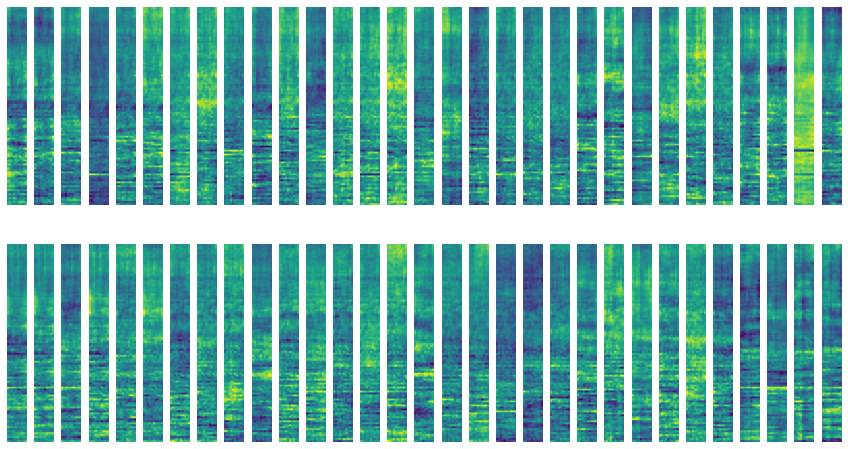

Train loss for epoch 21: 0.28152740001678467
Val loss for epoch 21: 0.7406747937202454
Train loss for epoch 22: 0.4369465112686157
Val loss for epoch 22: 1.0792826414108276
Train loss for epoch 23: 0.4815642237663269
Val loss for epoch 23: 0.94818115234375
Train loss for epoch 24: 0.41429007053375244
Val loss for epoch 24: 0.6884843111038208
Train loss for epoch 25: 0.4188685715198517
Val loss for epoch 25: 0.8264844417572021
Train loss for epoch 26: 0.4019688069820404
Val loss for epoch 26: 0.7086529731750488
Train loss for epoch 27: 0.34719717502593994
Val loss for epoch 27: 0.7191082239151001
Train loss for epoch 28: 0.3824152648448944
Val loss for epoch 28: 0.7283167839050293
Train loss for epoch 29: 0.497955322265625
Val loss for epoch 29: 1.3875887393951416
Train loss for epoch 30: 0.4201534688472748
Val loss for epoch 30: 0.7942090034484863


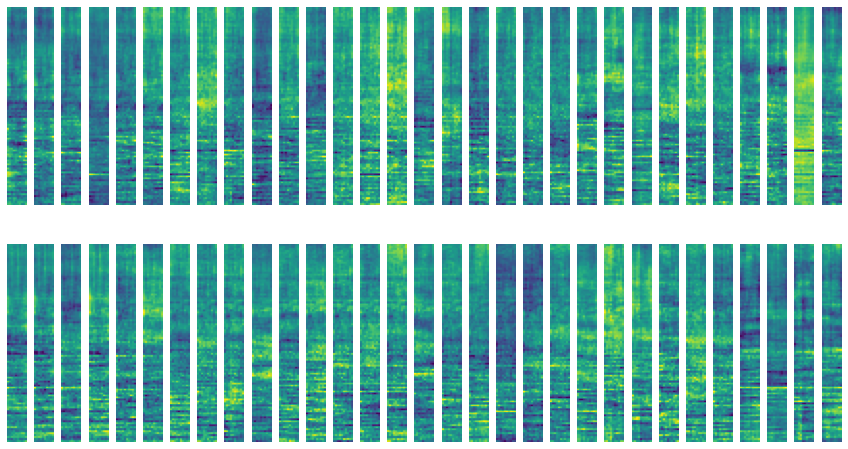

Train loss for epoch 31: 0.40457189083099365
Val loss for epoch 31: 0.9173427820205688
Train loss for epoch 32: 0.6335046291351318
Val loss for epoch 32: 1.6035183668136597
Train loss for epoch 33: 0.3734155595302582
Val loss for epoch 33: 0.9820960760116577
Train loss for epoch 34: 0.35687455534935
Val loss for epoch 34: 0.9901854395866394
Train loss for epoch 35: 0.5869342088699341
Val loss for epoch 35: 0.8989479541778564
Train loss for epoch 36: 0.5490901470184326
Val loss for epoch 36: 0.8815450072288513
Train loss for epoch 37: 0.3717871308326721
Val loss for epoch 37: 1.2085247039794922
Train loss for epoch 38: 0.3952758014202118
Val loss for epoch 38: 0.8841151595115662
Train loss for epoch 39: 0.3726503252983093
Val loss for epoch 39: 0.700312077999115
Train loss for epoch 40: 0.35367104411125183
Val loss for epoch 40: 0.9927183985710144


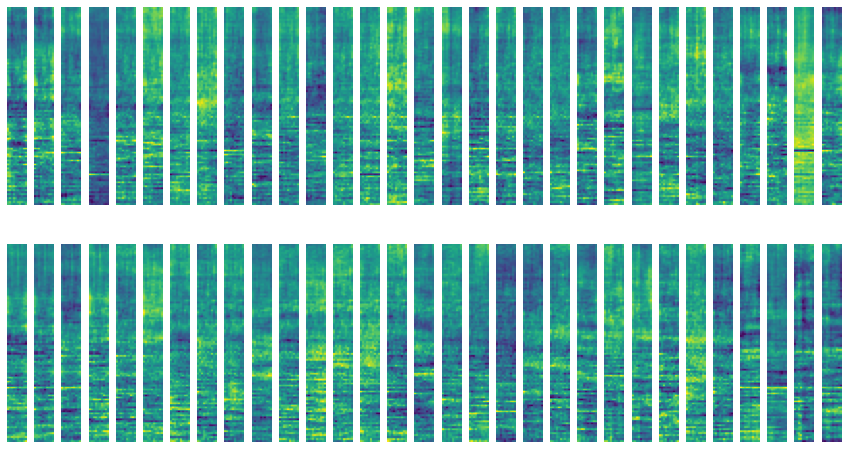

Train loss for epoch 41: 0.4710176885128021
Val loss for epoch 41: 1.4992492198944092
Train loss for epoch 42: 0.49881553649902344
Val loss for epoch 42: 0.8904277682304382
Train loss for epoch 43: 0.3343893885612488
Val loss for epoch 43: 0.8206474184989929
Train loss for epoch 44: 0.26663291454315186
Val loss for epoch 44: 0.7440698742866516
Train loss for epoch 45: 0.43827852606773376
Val loss for epoch 45: 0.8259404897689819
Train loss for epoch 46: 0.39190489053726196
Val loss for epoch 46: 0.8740637898445129
Train loss for epoch 47: 0.46408724784851074
Val loss for epoch 47: 0.8421998023986816
Train loss for epoch 48: 0.3581467866897583
Val loss for epoch 48: 0.8272973299026489
Train loss for epoch 49: 0.40857023000717163
Val loss for epoch 49: 0.7667880654335022
Train loss for epoch 50: 0.4597906172275543
Val loss for epoch 50: 0.8508291244506836


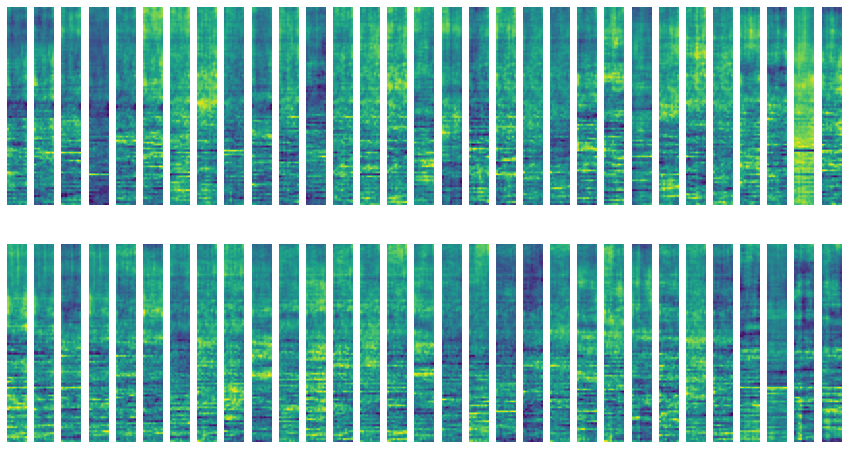

In [17]:
epochs = []
training_losses = []
training_acc = []
val_losses = []
validation_acc = []
for epoch in range(num_epochs):
    avg_train_loss, train_acc = train(model, criterion, optimizer, train_loader, epoch, alpha=alpha)
    print('Train loss for epoch {}: {}'.format(epoch, avg_train_loss))
    val_loss, val_acc = test(model, criterion, optimizer, val_loader)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    if val_losses:
        if val_loss < min(val_losses):
            path = '/mnt/pesaranlab/People/Capstone_students/Yue/model_v5'
            torch.save(model.state_dict(), '{}/lr_reg{}_alpha{}.pt'.format(path, l2, alpha))
    if epoch%10 == 0:
        weights = model.linear.weight.view(62, 100, 10)
        plt.figure(figsize=(15,8))
        for i in range(62):
            weights_sub = weights[i].detach().cpu()
            plt.subplot(2,31,i+1)
            plt.axis('off')
            plt.imshow(weights_sub)
            # plt.clim(-0.03, 0.03)
        plt.show()
    epochs.append(epoch)
    training_losses.append(avg_train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if avg_train_loss < tol:
        break

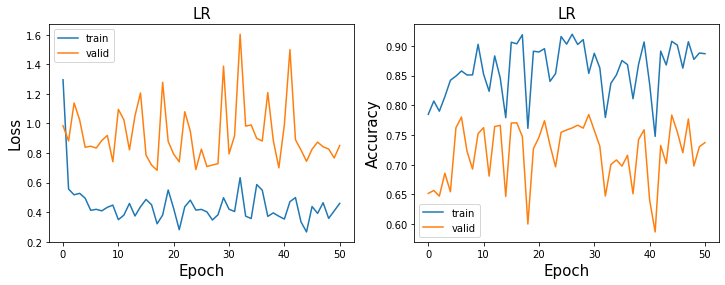

In [18]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.title("LR", fontsize = 15)
plt.plot(training_losses,linewidth = 1.5,label = 'train')
plt.plot(val_losses,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Loss", fontsize = 15)
plt.legend()
plt.subplot(1,2,2)
plt.title("LR", fontsize = 15)
plt.plot(training_acc,linewidth = 1.5,label = 'train')
plt.plot(validation_acc,linewidth = 1.5,label = 'valid')
plt.xlabel("Epoch",fontsize = 15)
plt.ylabel("Accuracy", fontsize = 15)
plt.legend()
plt.show()